### Laboratorium 6 - część badawcza

W pakiecie OpenCV wszystkie zadania związane z detekcją i opisem punktów kluczowych realizowane są przez zestaw specjalnych klas, dla których bazową jest `cv::Feature2D`. Jedną z wielu pochodnych tej klasy jest interesująca nas na zajęciach `cv::SIFT`, z której dokumentacją należy się zapoznać.  
Najważniejsze, co trzeba wiedzieć:
1. do konstrukcji obiektu SIFT służy metoda [`cv2.SIFT_create`](https://docs.opencv.org/4.x/d7/d60/classcv_1_1SIFT.html#ad337517bfdc068ae0ba0924ff1661131) - to do niej przekazujemy parametry detektora (w dokumentacji występuje jako `cv::SIFT::create`);
2. obsługujemy detektor przez interfejs `cv::Feature2D`, konkretnie metody [`detect`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#aa4e9a7082ec61ebc108806704fbd7887) do detekcji punktów kluczowych oraz [`compute`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#ab3cce8d56f4fc5e1d530b5931e1e8dc0) do obliczania ich deskryptorów (opcjonalnie `detectAndCompute`).

Schemat użycia:
```python
sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
```

`keypoints` jest listą obiektów specjalnego typu `cv2.KeyPoint`, która **jest modyfikowana** przez `SIFT::compute`!  
`descriptors` jest natomiast macierzą float32 o wymiarach NxK, gdzie N jest liczbą punktów kluczowych, a K jest liczbą obliczonych cech.

Warto również zapoznać się z funkcją [`cv2.drawKeypoints`](https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920) w kontekście prezentacji wyników. Zwróć uwagę na flagi sterujące rysowaniem - szczególnie użyteczna jest `cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

#### Zadanie 1

Przetestuj wpływ podstawowych parametrów detektora SIFT (`contrastThreshold` i `edgeThreshold`) na uzyskiwane punkty kluczowe (liczność, lokalizacja, rozmiar), korzystając z obrazów `cells` i `lena`. Pamiętaj że ich działanie jest odwrotne (tzn. jeden odsiewa cechy "mniejsze niż", a drugi "większe niż").

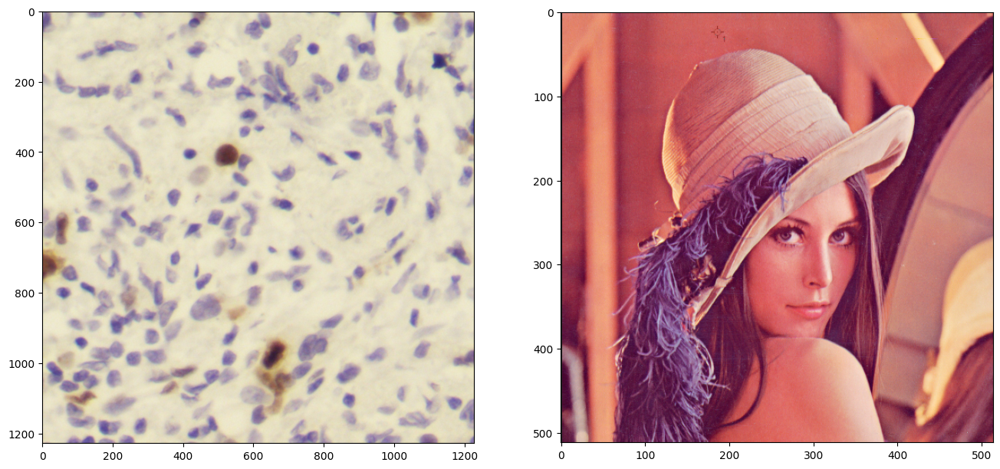

In [3]:
cells = cv2.imread('p1_0308_7.jpg')
lena = cv2.imread('Lena.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(cells[..., ::-1]);
a2.imshow(lena[..., ::-1]);

ContrastThreshold: 0.01, EdgeThreshold: 10
Liczba punktów kluczowych (cells): 2262
Liczba punktów kluczowych (lena): 2116


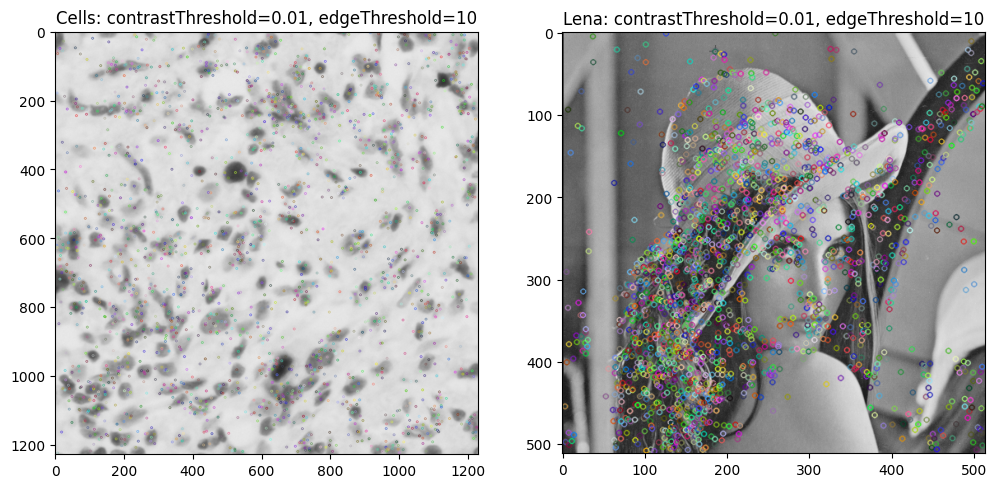

ContrastThreshold: 0.04, EdgeThreshold: 10
Liczba punktów kluczowych (cells): 705
Liczba punktów kluczowych (lena): 1112


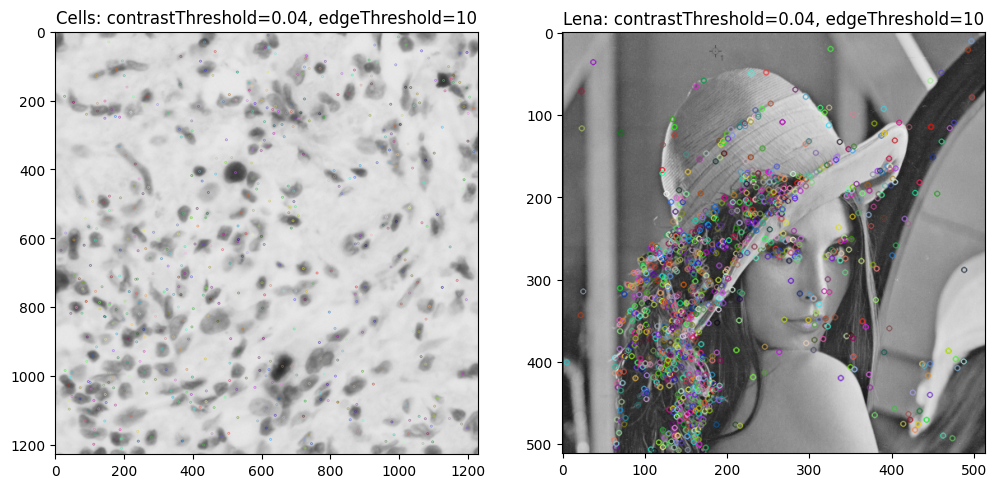

ContrastThreshold: 0.1, EdgeThreshold: 10
Liczba punktów kluczowych (cells): 153
Liczba punktów kluczowych (lena): 260


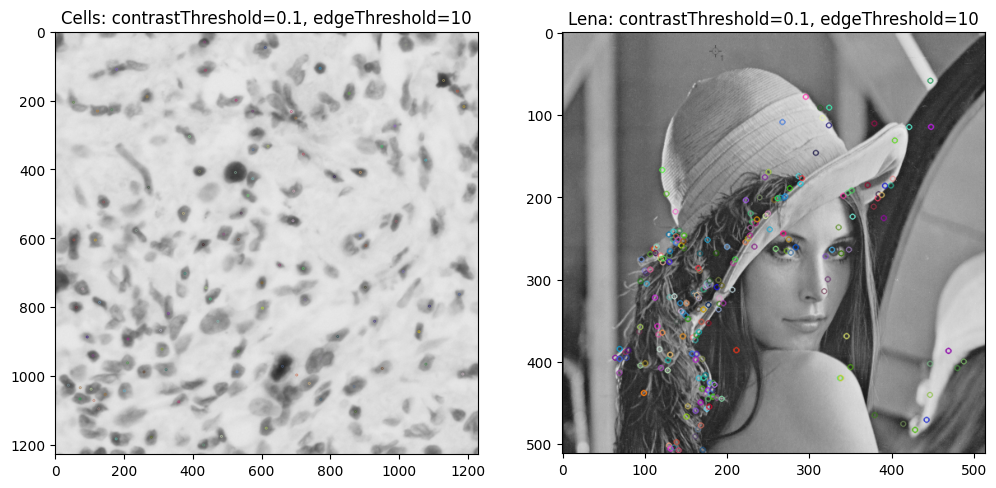

ContrastThreshold: 0.04, EdgeThreshold: 2
Liczba punktów kluczowych (cells): 256
Liczba punktów kluczowych (lena): 149


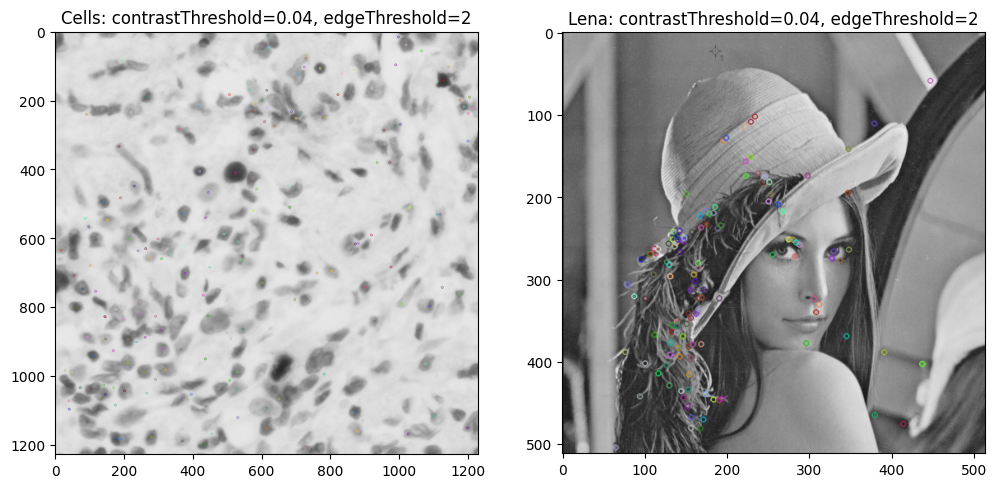

ContrastThreshold: 0.04, EdgeThreshold: 50
Liczba punktów kluczowych (cells): 748
Liczba punktów kluczowych (lena): 1510


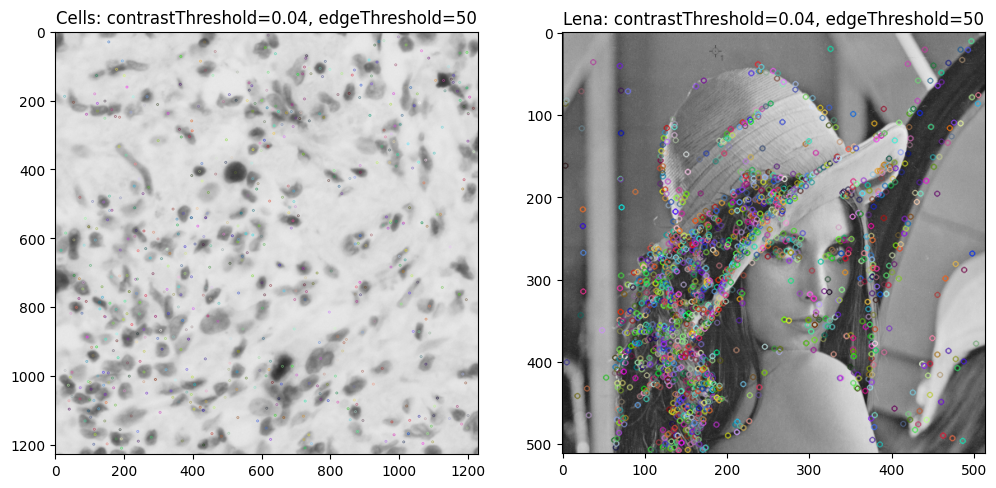

ContrastThreshold: 0.04, EdgeThreshold: 200
Liczba punktów kluczowych (cells): 748
Liczba punktów kluczowych (lena): 1532


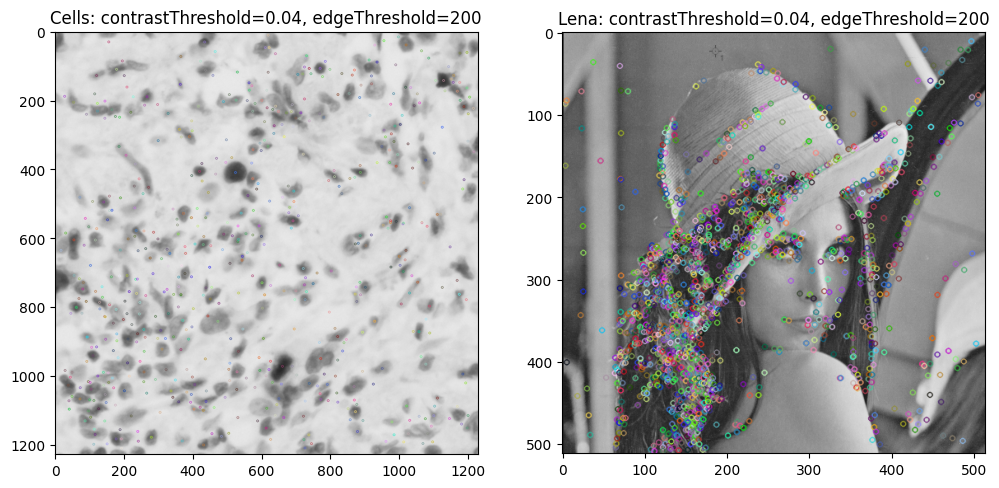

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

cells = cv2.imread('p1_0308_7.jpg')
lena = cv2.imread('Lena.jpg')
cells = cv2.cvtColor(cells, cv2.COLOR_BGR2GRAY)
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)

def plot_keypoints_in_subplot(image1, image2, keypoints1, keypoints2, contrastThreshold, edgeThreshold):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    img1 = cv2.drawKeypoints(image1, keypoints1, None)
    plt.imshow(img1)
    plt.title(f'Cells: contrastThreshold={contrastThreshold}, edgeThreshold={edgeThreshold}')

    plt.subplot(1, 2, 2)
    img2 = cv2.drawKeypoints(image2, keypoints2, None)
    plt.imshow(img2)
    plt.title(f'Lena: contrastThreshold={contrastThreshold}, edgeThreshold={edgeThreshold}')

    plt.show()

def test_sift_parameters_subplot(image1, image2, contrastThreshold, edgeThreshold):
    sift = cv2.SIFT_create(contrastThreshold=contrastThreshold, edgeThreshold=edgeThreshold)

    keypoints1, _ = sift.detectAndCompute(image1, None)
    keypoints2, _ = sift.detectAndCompute(image2, None)

    print(f"ContrastThreshold: {contrastThreshold}, EdgeThreshold: {edgeThreshold}")
    print(f"Liczba punktów kluczowych (cells): {len(keypoints1)}")
    print(f"Liczba punktów kluczowych (lena): {len(keypoints2)}")

    plot_keypoints_in_subplot(image1, image2, keypoints1, keypoints2, contrastThreshold, edgeThreshold)

test_sift_parameters_subplot(cells, lena, 0.01, 10)
test_sift_parameters_subplot(cells, lena, 0.04, 10)
test_sift_parameters_subplot(cells, lena, 0.1, 10)

test_sift_parameters_subplot(cells, lena, 0.04, 2)
test_sift_parameters_subplot(cells, lena, 0.04, 50)
test_sift_parameters_subplot(cells, lena, 0.04, 200)


#### Zadanie 2

Detektor SIFT jest w teorii niezmienniczy względem translacji, rotacji czy zmiany skali. Przetestuj te własności w praktyce, sprawdzając stabilność punktów wykrywanych na obróconej i przeskalowanej wersji obrazów `cells` i `lena`. Dokonaj oceny wizualnie, sprawdzając zachowanie detektora dla kilku wybranych rotacji i skal (**nie** grid search).

_Co świadczy o stabilności i niezmienniczości detektora?_

In [6]:
def rotate(image, angle, scale=1.0):
    center = (image.shape[0] // 2, image.shape[1] // 2)
    rmat = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(image, rmat, (image.shape[0], image.shape[1]), flags=cv2.INTER_CUBIC)

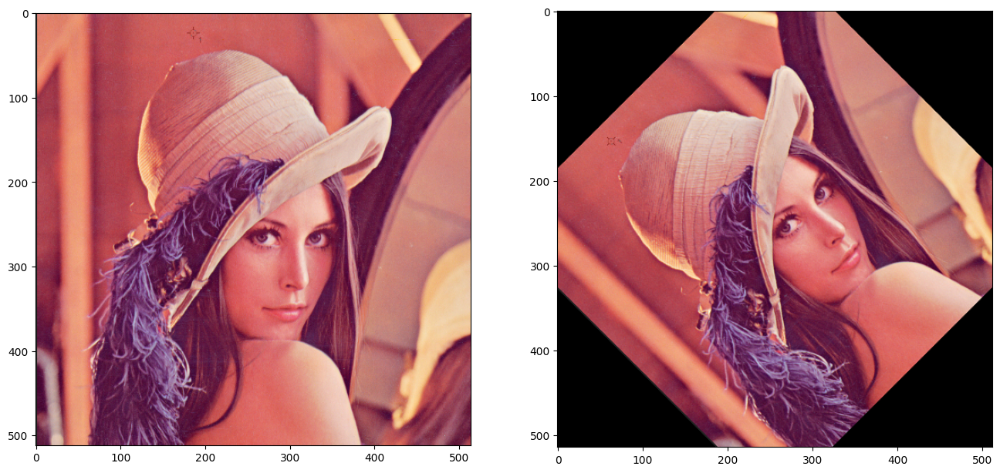

In [7]:
# przykład dla Leny, pamiętaj o cells!
lena_rot = rotate(lena, 45.0, scale=0.9)
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(lena[..., ::-1]);
a2.imshow(lena_rot[..., ::-1]);

Original image: 705 keypoints
Transformed image (Angle: 30, Scale: 0.8): 728 keypoints
Transformed image (Angle: 45, Scale: 1.0): 593 keypoints
Transformed image (Angle: 60, Scale: 1.2): 478 keypoints
Original image: 1112 keypoints
Transformed image (Angle: 30, Scale: 0.8): 750 keypoints
Transformed image (Angle: 45, Scale: 1.0): 1080 keypoints
Transformed image (Angle: 60, Scale: 1.2): 1378 keypoints


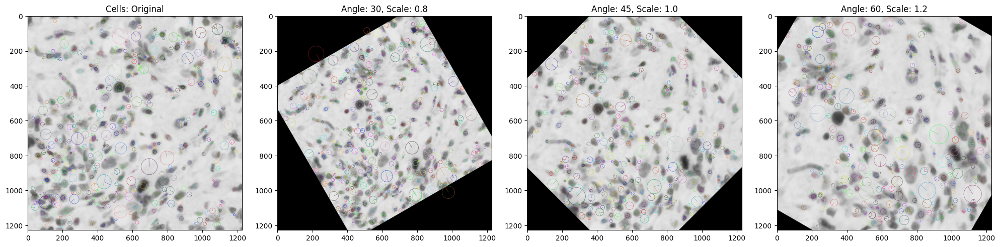

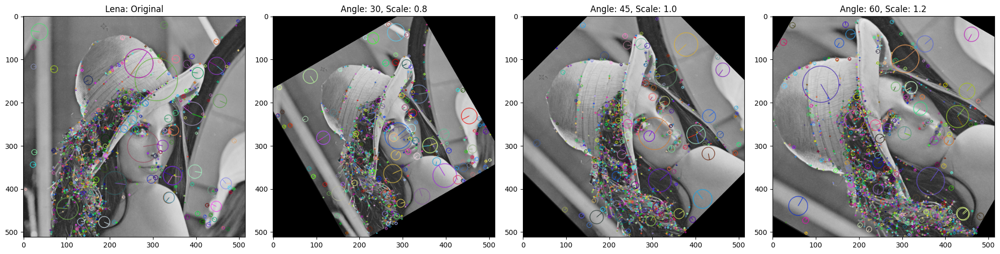

In [6]:
cells = cv2.imread('p1_0308_7.jpg')
lena = cv2.imread('Lena.jpg')
cells = cv2.cvtColor(cells, cv2.COLOR_BGR2GRAY)
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)

def rotate(image, angle, scale=1.0):
    center = (image.shape[1] // 2, image.shape[0] // 2)
    rmat = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(image, rmat, (image.shape[1], image.shape[0]), flags=cv2.INTER_CUBIC)

angles = [30, 45, 60] 
scales = [0.8, 1.0, 1.2] 

sift = cv2.SIFT_create()

def process_image(img, angles, scales):
    kp_original, des_original = sift.detectAndCompute(img, None)

    transformed_images = []
    transformed_kps = []
    print(f"Original image: {len(kp_original)} keypoints")

    for angle, scale in zip(angles, scales):
        img_transformed = rotate(img, angle, scale)
        kp_transformed, _ = sift.detectAndCompute(img_transformed, None)
        print(f"Transformed image (Angle: {angle}, Scale: {scale}): {len(kp_transformed)} keypoints")
        transformed_images.append(img_transformed)
        transformed_kps.append(kp_transformed)

    return kp_original, des_original, transformed_images, transformed_kps

kp_cells, _, trans_cells, kps_cells = process_image(cells, angles, scales)
kp_lena, _, trans_lena, kps_lena = process_image(lena, angles, scales)

def visualize_results(img, kp_original, trans_imgs, trans_kps, title):
    fig, axes = plt.subplots(1, len(trans_imgs) + 1, figsize=(20, 10))
    axes[0].imshow(cv2.drawKeypoints(img, kp_original, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS), cmap='gray')
    axes[0].set_title(f'{title}: Original')
    for i, (timg, tkp) in enumerate(zip(trans_imgs, trans_kps)):
        axes[i + 1].imshow(cv2.drawKeypoints(timg, tkp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS), cmap='gray')
        axes[i + 1].set_title(f'Angle: {angles[i]}, Scale: {scales[i]}')
    plt.tight_layout()
    plt.show()

visualize_results(cells, kp_cells, trans_cells, kps_cells, "Cells")
visualize_results(lena, kp_lena, trans_lena, kps_lena, "Lena")


#### Zadanie 3

Dane są obrazy `coke` i `table`. Wykorzystaj metodologię parowania punktów kluczowych do znalezienia wystąpienia puszki z Colą na stole. To zadanie jest podzielone na dwie części - czytaj dalej.

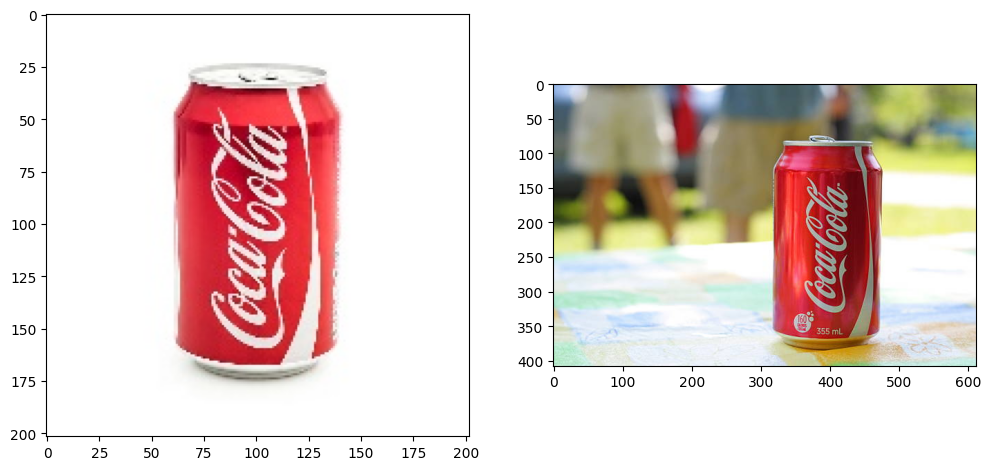

In [26]:
coke = cv2.imread('coke.jpg')[..., ::-1]
table = cv2.imread('coke-table.jpg')[..., ::-1]
f, (a1, a2) = plt.subplots(1, 2, figsize=(12,12))
a1.imshow(coke);
a2.imshow(table);

##### Zadanie 3a

Wykonaj detekcję punktów kluczowych i ich parowanie z użyciem dowolnego matchera. Wykonaj filtrację znalezionych par po dystansie - co obserwujesz, zmieniając próg?

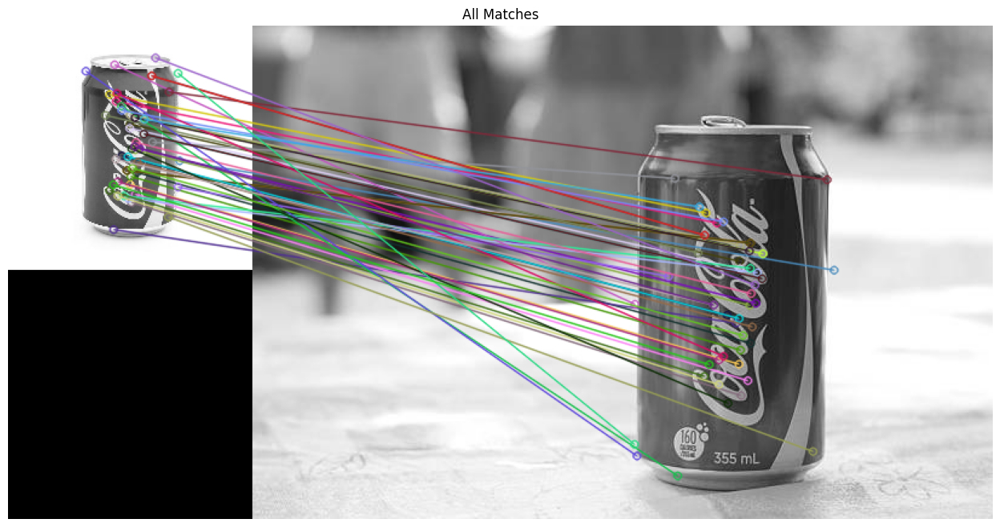

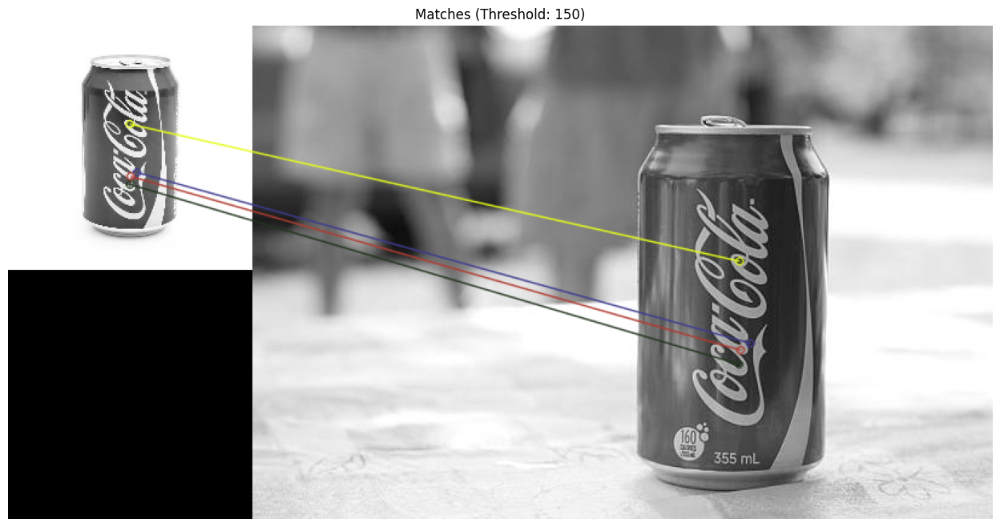

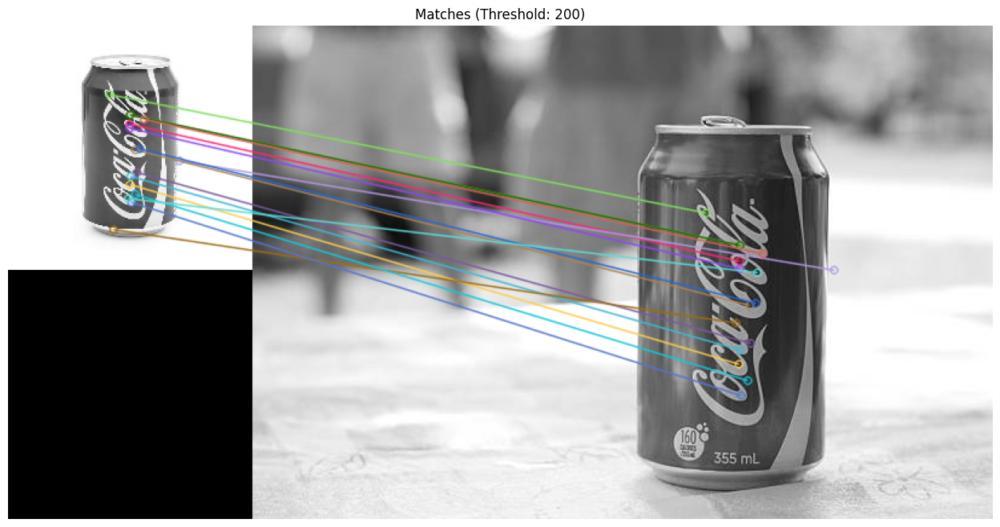

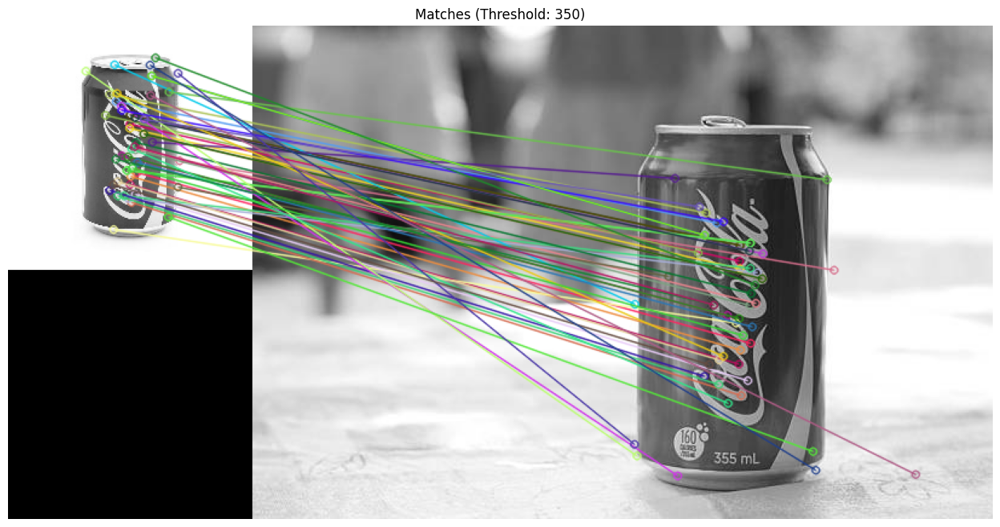

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

coke = cv2.imread('coke.jpg', cv2.IMREAD_GRAYSCALE)
table = cv2.imread('coke-table.jpg', cv2.IMREAD_GRAYSCALE)

sift = cv2.SIFT_create()

kp_coke, des_coke = sift.detectAndCompute(coke, None)
kp_table, des_table = sift.detectAndCompute(table, None)

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

matches = bf.match(des_coke, des_table)

matches = sorted(matches, key=lambda x: x.distance)

def visualize_matches(img1, kp1, img2, kp2, matches, num_matches=20, title="Matches"):
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:num_matches], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(16, 8))
    plt.imshow(img_matches[..., ::-1])
    plt.title(title)
    plt.axis("off")
    plt.show()

visualize_matches(coke, kp_coke, table, kp_table, matches, num_matches=50, title="All Matches")

thresholds = [150, 200, 350]  
for thresh in thresholds:
    filtered_matches = [m for m in matches if m.distance < thresh]
    visualize_matches(coke, kp_coke, table, kp_table, filtered_matches, num_matches=len(filtered_matches), title=f"Matches (Threshold: {thresh})")


##### Zadanie 3b

Znajdź transformację geometryczną dla par dopasowanych punktów, tak aby przekształcić `coke` (_train_) do geometrii `table` (_query_). Zademonstruj poprawność, zestawiając obok siebie przekształconą wersję `coke` oraz oryginalny `table`, bądź nanosząc jedno na drugie. Zidentyfikuj punkty, które znaleziona transformacja przekształca "dobrze", tzn. ich współrzędne po przekształceniu leżą w pobliżu odpowiadających im punktów z drugiego obrazu; nanieś je na obraz.

*Jak na wyniki wpływa wykrycie większej lub mniejszej liczby punktów kluczowych na etapie SIFT? W jakim stopniu filtracja poprawia rezultaty? Jak działa i jaką rolę w procesie parowania odgrywa RANSAC?*

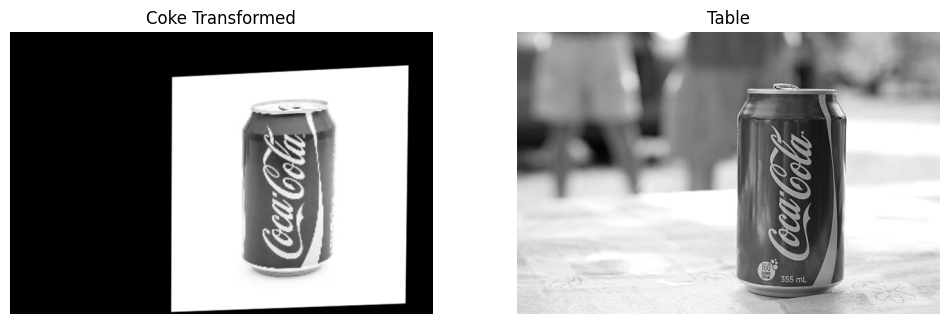

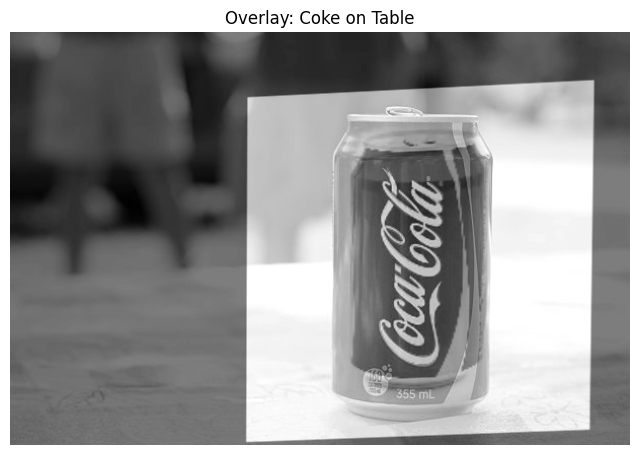

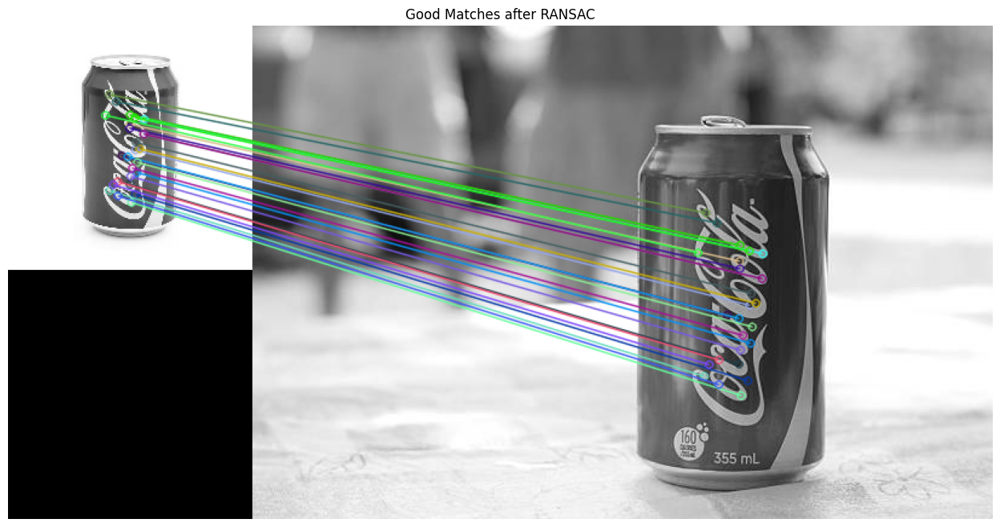

In [15]:
src_pts = np.float32([kp_coke[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kp_table[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
matches_mask = mask.ravel().tolist() 

height, width = table.shape
coke_transformed = cv2.warpPerspective(coke, H, (width, height))

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(coke_transformed, cmap='gray')
plt.title("Coke Transformed")
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(table, cmap='gray')
plt.title("Table")
plt.axis('off')
plt.show()

overlay = cv2.addWeighted(coke_transformed, 0.5, table, 0.5, 0)
plt.figure(figsize=(8, 8))
plt.imshow(overlay, cmap='gray')
plt.title("Overlay: Coke on Table")
plt.axis('off')
plt.show()

good_matches = []
for i, m in enumerate(matches):
    if matches_mask[i]: 
        good_matches.append(m)

img_matches = cv2.drawMatches(coke, kp_coke, table, kp_table, good_matches, None, 
                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(16, 8))
plt.imshow(img_matches[..., ::-1])
plt.title("Good Matches after RANSAC")
plt.axis("off")
plt.show()

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def process_images(image1_path, image2_path, contrast_threshold=200, edge_threshold=100, distance_threshold=150):
    img1 = cv2.imread(image1_path, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(image2_path, cv2.IMREAD_GRAYSCALE)

    sift = cv2.SIFT_create(contrastThreshold=contrast_threshold, edgeThreshold=edge_threshold)

    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(des1, des2)

    matches = sorted(matches, key=lambda x: x.distance)

    filtered_matches = [m for m in matches if m.distance < distance_threshold]

    def visualize_matches(img1, kp1, img2, kp2, matches, num_matches=20, title="Matches"):
        img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:num_matches], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.figure(figsize=(16, 8))
        plt.imshow(img_matches[..., ::-1])
        plt.title(title)
        plt.axis("off")
        plt.show()

    visualize_matches(img1, kp1, img2, kp2, matches, num_matches=50, title="All Matches")

    visualize_matches(img1, kp1, img2, kp2, filtered_matches, num_matches=len(filtered_matches), title=f"Matches (Threshold: {distance_threshold})")

    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    if len(filtered_matches) > 4:  
        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        matches_mask = mask.ravel().tolist()

        height, width = img2.shape
        img1_transformed = cv2.warpPerspective(img1, H, (width, height))

        overlay = cv2.addWeighted(img1_transformed, 0.5, img2, 0.5, 0)
        plt.figure(figsize=(8, 8))
        plt.imshow(overlay, cmap='gray')
        plt.title("Overlay: Image 1 on Image 2")
        plt.axis('off')
        plt.show()
        good_matches = []
        for i, m in enumerate(filtered_matches):
            if matches_mask[i]:
                good_matches.append(m)

        img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, 
                                      flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.figure(figsize=(16, 8))
        plt.imshow(img_matches[..., ::-1])
        plt.title("Good Matches after RANSAC")
        plt.axis("off")
        plt.show()


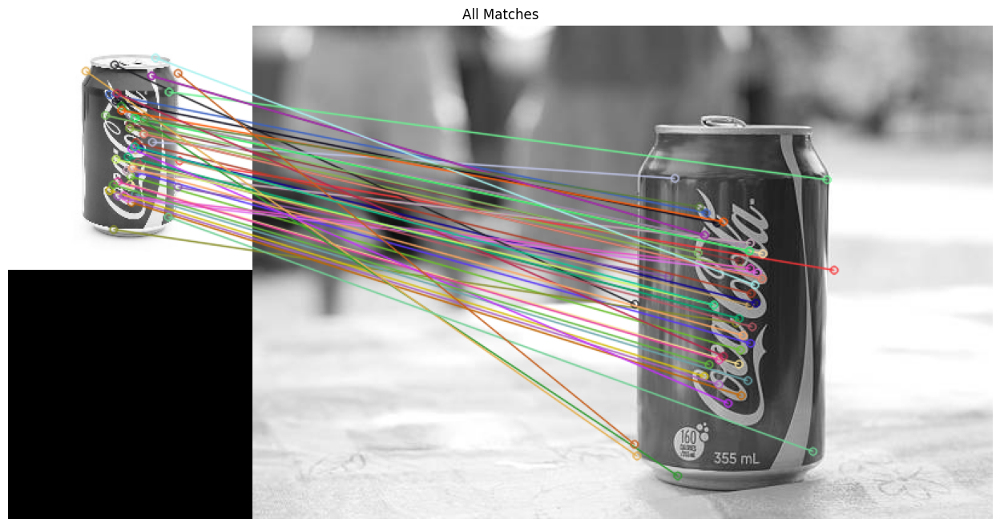

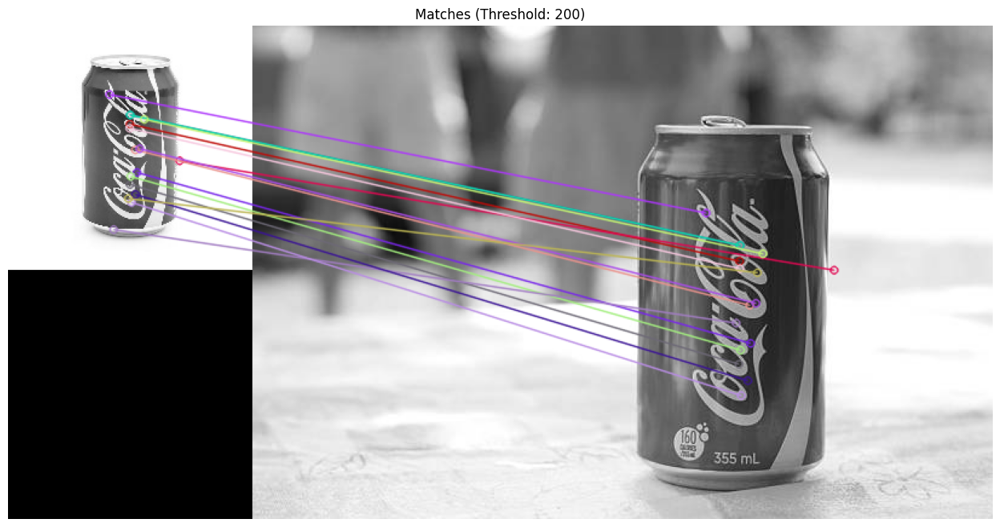

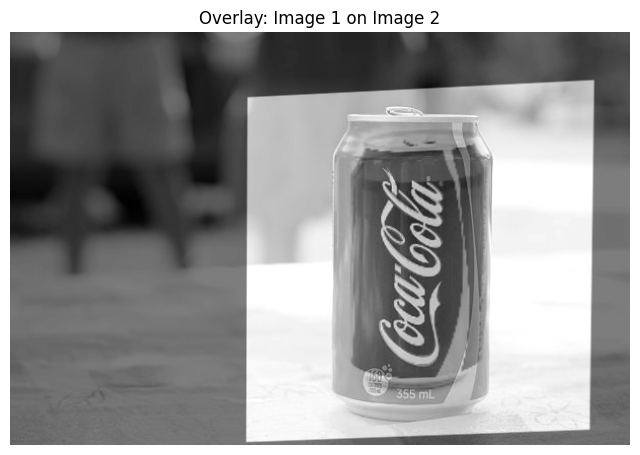

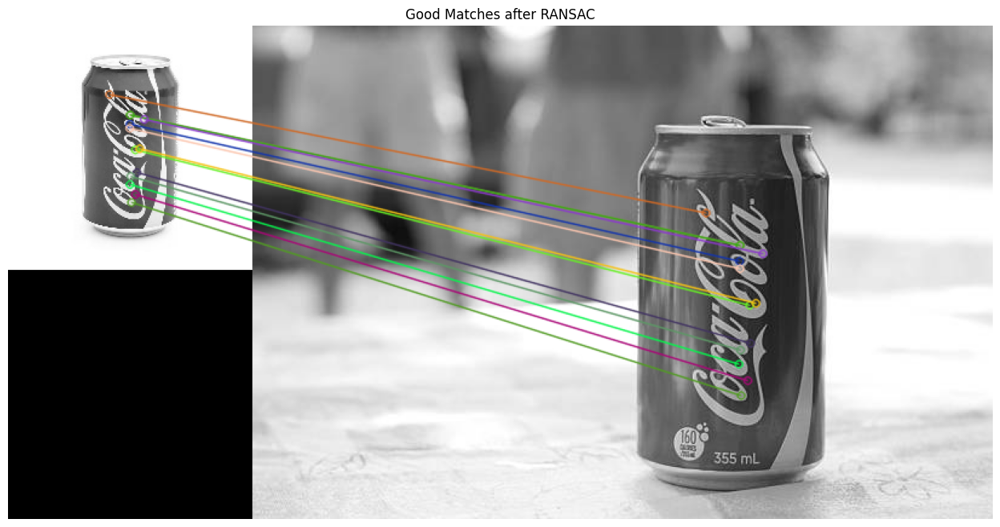

In [25]:
process_images('coke.jpg', 'coke-table.jpg', contrast_threshold=0.04, edge_threshold=10, distance_threshold=200)

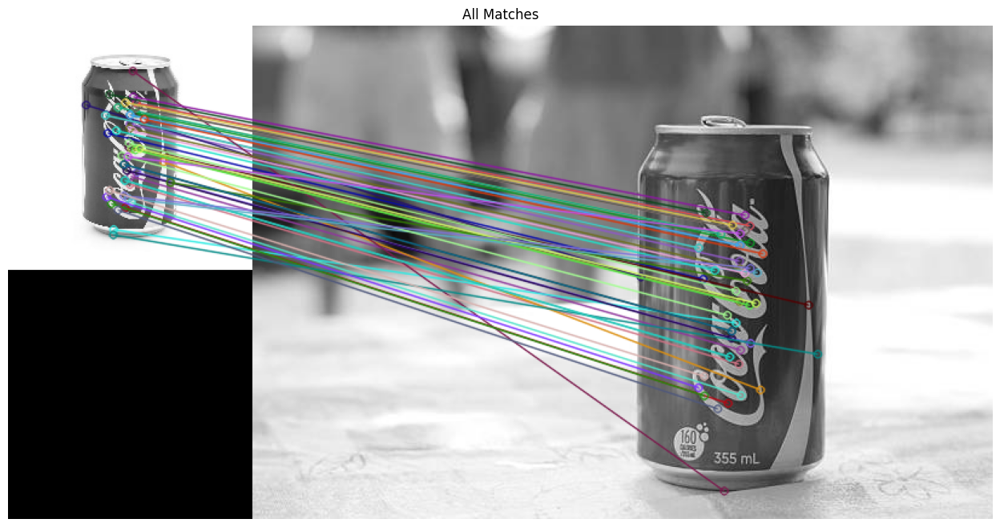

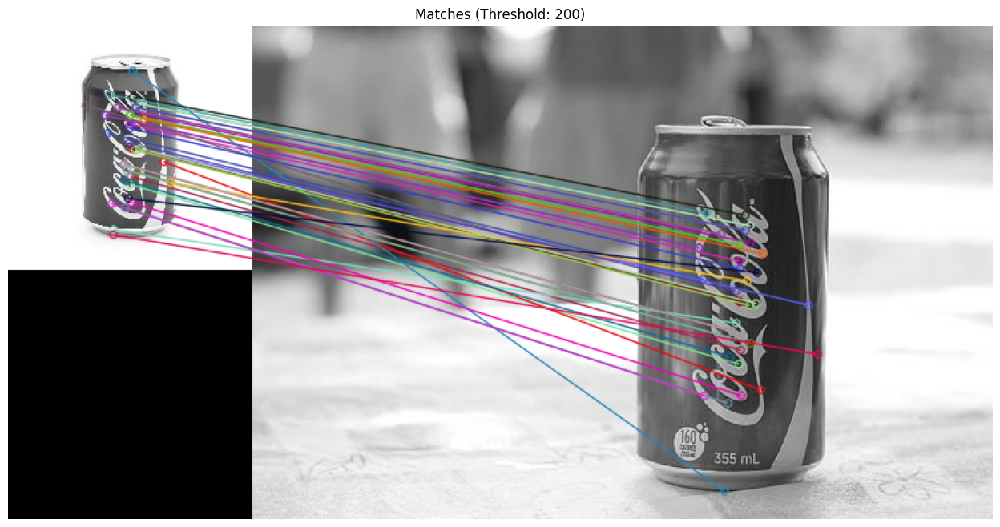

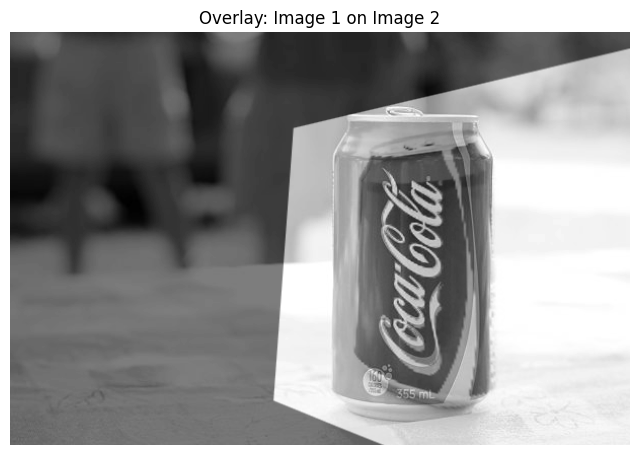

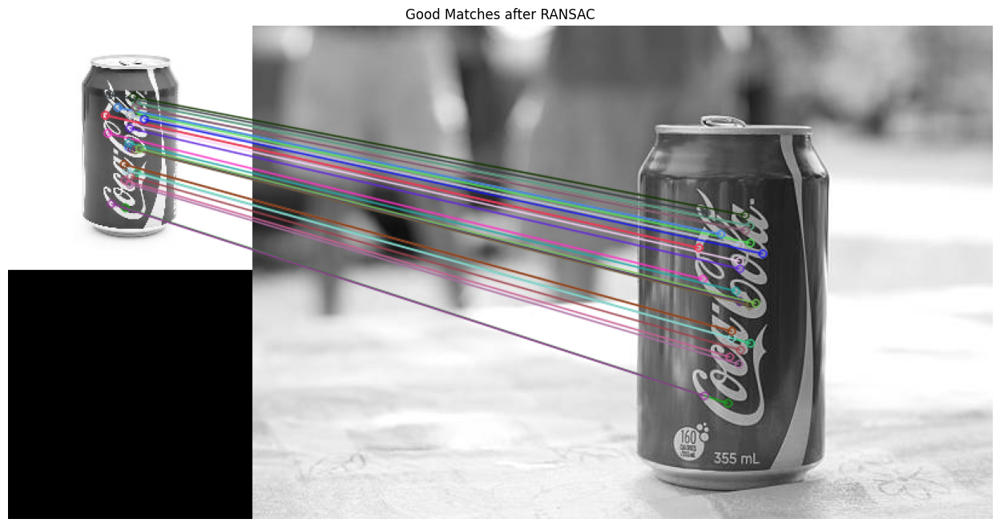

In [28]:
process_images('coke.jpg', 'coke-table.jpg', contrast_threshold=0.1, edge_threshold=100, distance_threshold=200)

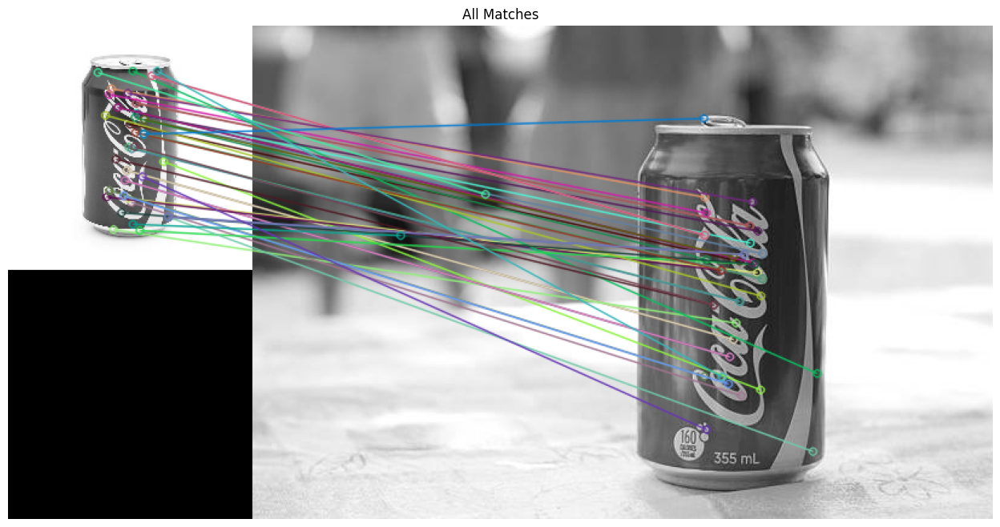

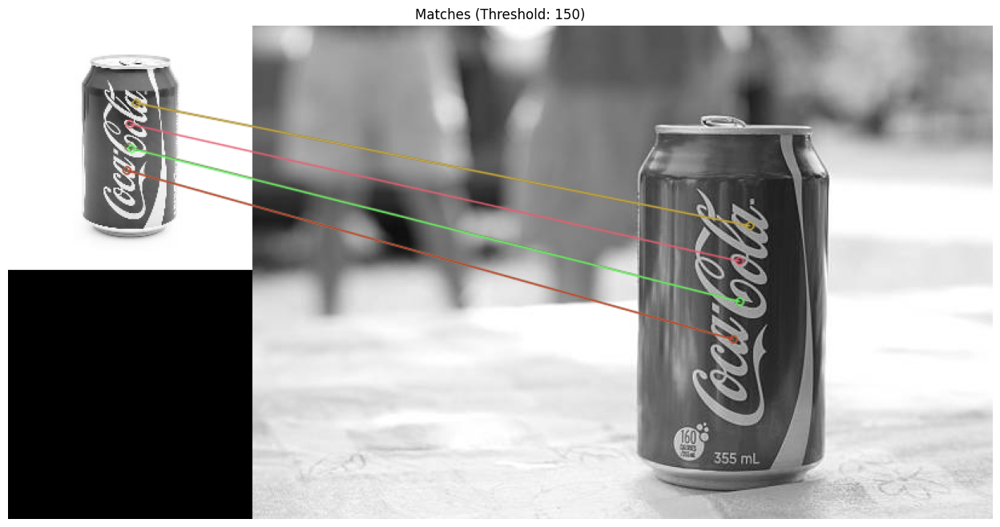

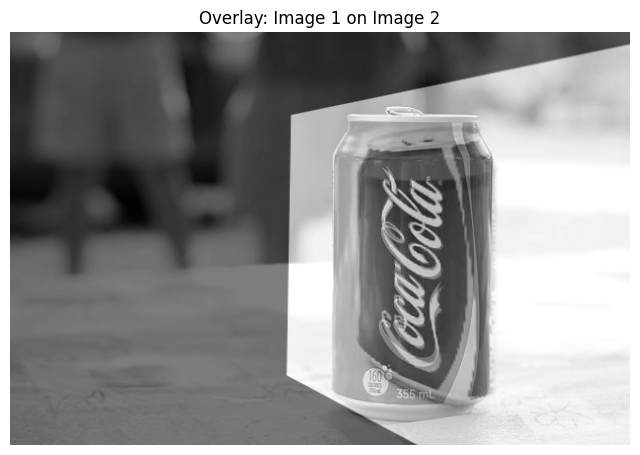

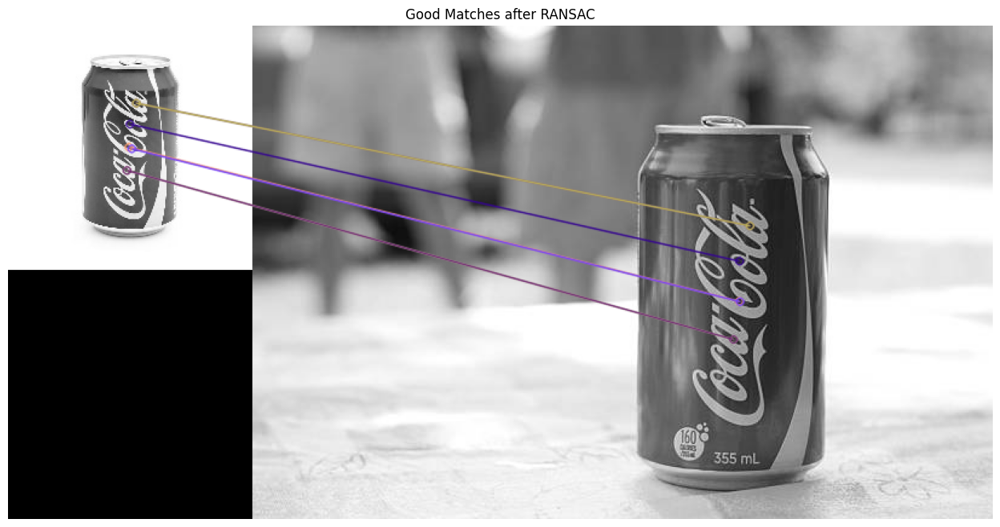

In [37]:
process_images('coke.jpg', 'coke-table.jpg', contrast_threshold=0.15, edge_threshold=300, distance_threshold=150)